# Design Project

## Initialisation

In [27]:
%run init.py

Loading in libraries... done.
Loading in functions... done.


## Reading in data

Your working directory should look like this:

```
.
├── data
│   ├── norm_meta_batch_effect_removal_phase1.csv
│   ├── norm_meta_batch_effect_removal_phase2.csv
│   ├── norm_meta_batch_effect_removed_scaled_logtrans_phase1.csv
│   ├── norm_meta_batch_effect_removed_scaled_logtrans_phase2.csv
│   ├── norm_meta_phase1.csv
│   ├── norm_meta_phase2.csv
│   └── probe_metadata.csv
├── Design_Project.ipynb
├── init.py
└── correlation_functions.py
```

In [1]:
# Choose dataset
dataset = 'norm_meta_batch_effect_removal'

# Load in dataset
R1_SOMAMeta_raw, R1_SOMAMeta, R2_SOMAMeta, R1_SOMA, R2_SOMA, R1_Meta, R2_Meta, R1_Age, R2_Age, analyte_conv = load_in_data(dataset)

NameError: name 'load_in_data' is not defined

In [4]:
print(R1_SOMAMeta.shape, 'datapoints of which', len(R1_SOMA.columns), 'protein intensities and', len(R1_Meta.columns), 'metadata features.')
R1_SOMAMeta[:3]

(1077, 8530) datapoints of which 7523 protein intensities and 1007 metadata features.


,Unnamed: 0,visit_id,SampleId,seq.10000.28,seq.10001.7,seq.10003.15,seq.10006.25,seq.10008.43,seq.10010.10,seq.10011.65,...,crpclasses,trte,trte2,trte3,CarotidIMTmeanmeanmm,agefatherbirth,TRF1,TRF2,meanTRF,year-month
visit_id,,,,,,,,,,,,,,,,,,,,,
2100302,1,2100302,BM0019857,628.474976,311.938441,174.437465,706.004328,379.870182,314.791199,2020.393879,...,2,0,0,0,0.645,NaN,7.685,NaN,7.685,2002-10
2100701,2,2100701,BM0019884,789.330739,293.110325,192.211378,763.095116,621.402571,858.182482,2886.576859,...,2,0,0,0,0.740,38.0,6.621,NaN,6.621,2002-10
2100702,3,2100702,BM0019893,580.734362,291.985139,165.697806,772.262980,515.388654,349.916072,2741.089765,...,2,0,0,0,0.630,26.0,8.551,NaN,8.551,2002-10


In [5]:
print(R2_SOMAMeta.shape, 'datapoints of which', len(R2_SOMA.columns), 'protein intensities and', len(R2_Meta.columns), 'metadata features.')
R2_SOMAMeta[:3]

(1232, 8194) datapoints of which 7523 protein intensities and 671 metadata features.


,Unnamed: 0,visit_id,SampleId,seq.10000.28,seq.10001.7,seq.10003.15,seq.10006.25,seq.10008.43,seq.10010.10,seq.10011.65,...,distance check 2,distance check 3,PWV round 2 (rest),Time interval aortic to femoral (handgrip round 2; msec),PWV round 2 (handgrip),Averaged sternal notch to femoral distance (R1&2; cm),PWV round 2 (averaged distance; rest),PWV round 1 (averaged distance; rest),PWV round 2 (averaged distance; handgrip),year-month
visit_id,,,,,,,,,,,,,,,,,,,,,
2100301,1,2100301,FF08879602,587.791715,279.507065,175.556101,717.258919,834.051105,353.616648,2588.101643,...,6.0,0.0,14.6850000002926202,37.282942,13.6791780821271328,58.00,16.700588,NaN,15.556712,2015-08
2100302,2,2100302,FF08879730,637.783254,420.057717,173.622121,755.020850,446.570647,334.608665,1926.698411,...,3.0,0.0,7.306838709918073,71.000000,7.323943661971831,57.00,8.009419,6.949016,8.028169,2012-02
2100303,3,2100303,FF08879830,597.149737,349.879056,175.047159,542.430324,416.525151,358.051844,2806.829568,...,7.0,0.0,4.6003999999756176,87.488458,6.0579419526501328,56.75,4.925900,4.469841,6.486570,2011-04


## Data exploration

### PCA

In [6]:
# Standardise
R1_SOMA_raw_std = standardise(R1_SOMAMeta_raw.loc[:, R1_SOMAMeta_raw.columns.str.startswith('seq')])
R1_SOMA_std = standardise(R1_SOMA)
R2_SOMA_std = standardise(R2_SOMA)

# Create a PCA model instance
pca = PCA(n_components=2)

# Fit and transform
R1_raw_PCA = pca.fit_transform(R1_SOMA_raw_std)
R1_PCA = pca.fit_transform(R1_SOMA_std)
R2_PCA = pca.fit_transform(R2_SOMA_std)

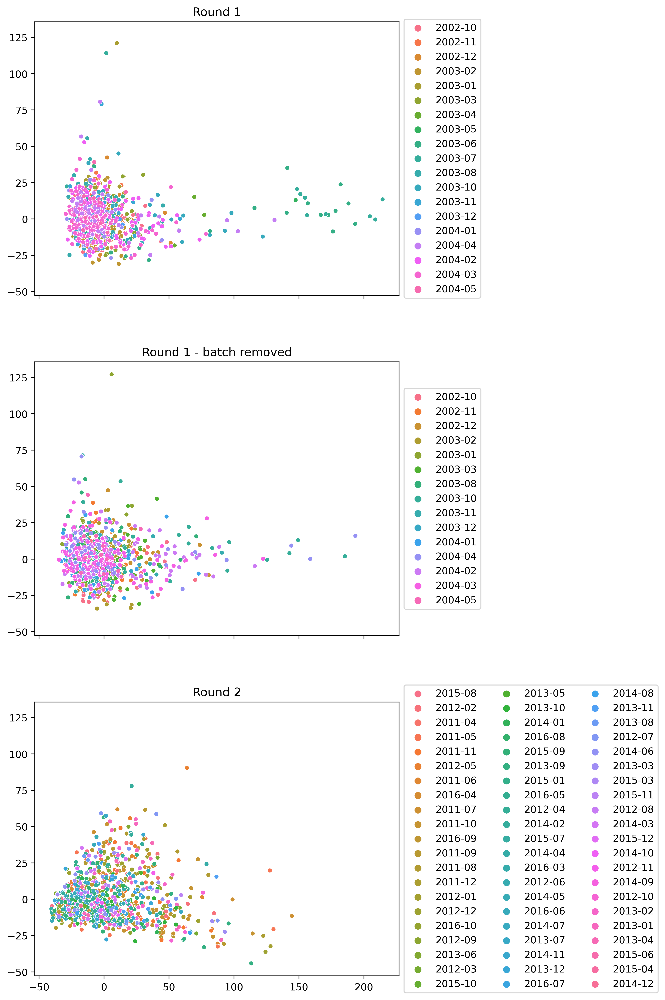

In [7]:
# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 15), sharex='col', sharey=True, dpi=400)

# Scatter plot for Round 1
sns.scatterplot(x=R1_raw_PCA[:, 0], y=R1_raw_PCA[:, 1], hue=R1_SOMAMeta_raw['year-month'], s=20, ax=ax1)
ax1.set_title('Round 1')
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Scatter plot for Round 1 and batch removed
sns.scatterplot(x=R1_PCA[:, 0], y=R1_PCA[:, 1], hue=R1_SOMAMeta['year-month'], s=20, ax=ax2)
ax2.set_title('Round 1 - batch removed')
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Scatter plot for Round 2
sns.scatterplot(x=R2_PCA[:, 0], y=R2_PCA[:, 1], hue=R2_SOMAMeta['year-month'], s=20, ax=ax3)
ax3.set_title('Round 2')
ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=3)

# Adjust spacing between subplots
fig.tight_layout(pad=3.0)

# Show the plot
plt.show()


### UMAP

In [8]:
# Combine data and scale
combined_data = np.concatenate((R1_SOMA, R2_SOMA), axis=0)
combined_data_scaled = minmax_scale(combined_data)

# Create a UMAP model instance
umap_model = umap.UMAP()

# Fit and transform combined data
combined_embedding = umap_model.fit_transform(combined_data_scaled)

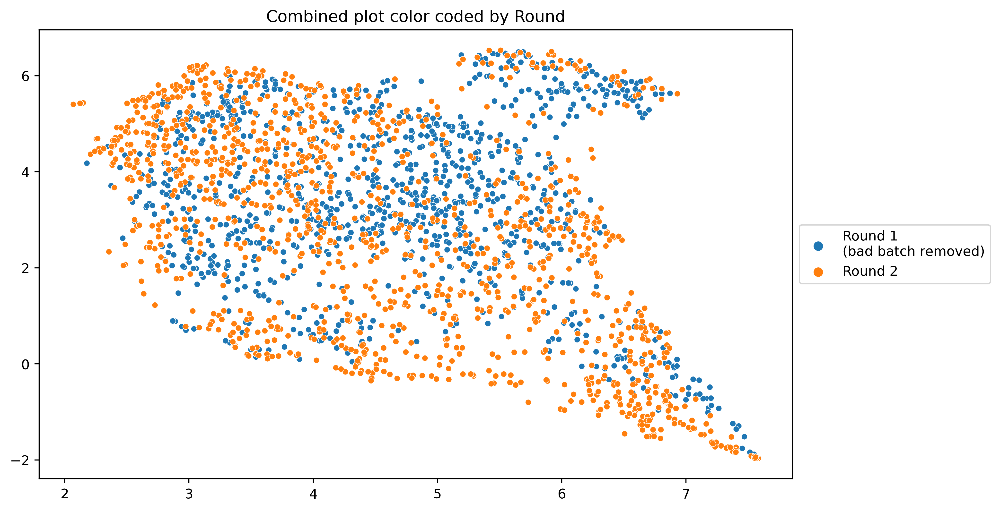

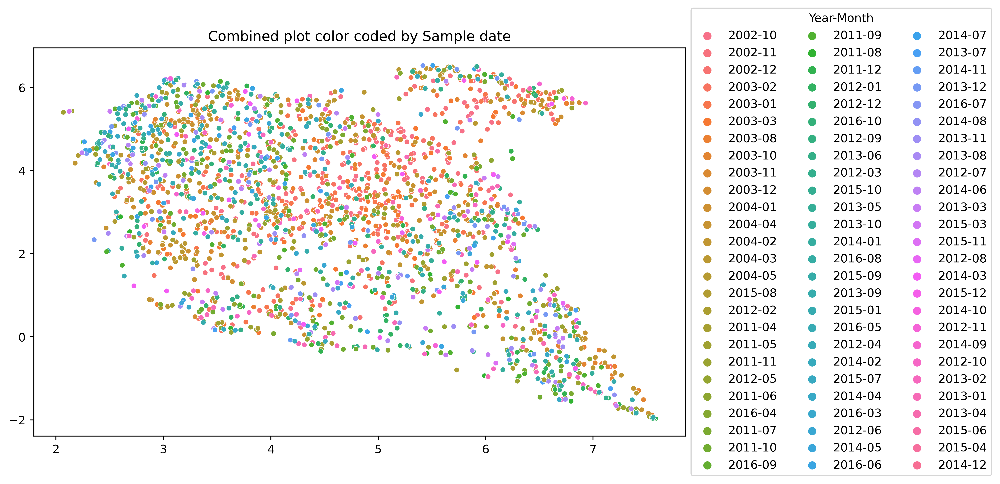

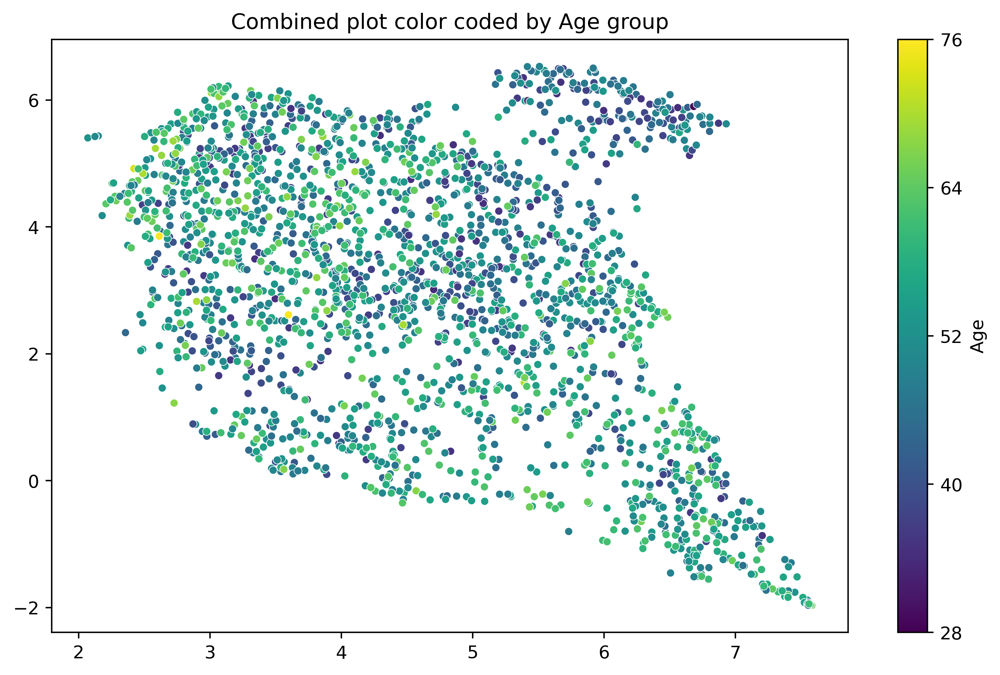

In [9]:
# Create individual figures and subplots for each plot
fig1, ax1 = plt.subplots(figsize=(10, 6), dpi=400)
fig2, ax2 = plt.subplots(figsize=(10, 6), dpi=400)
fig3, ax3 = plt.subplots(figsize=(10, 6), dpi=400)

# UMAP PLOT 1
labels_R1 = ['Round 1\n(bad batch removed)'] * len(R1_SOMA)
labels_R2 = ['Round 2'] * len(R2_SOMA)
labels1 = np.concatenate((labels_R1, labels_R2))

sns.scatterplot(x=combined_embedding[:, 0], y=combined_embedding[:, 1], hue=labels1, s=20, ax=ax1)
ax1.set_title('Combined plot color coded by Round')
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))


# UMAP PLOT 2
labels2 = np.concatenate((R1_SOMAMeta['year-month'], R2_SOMAMeta['year-month']))

sns.scatterplot(x=combined_embedding[:, 0], y=combined_embedding[:, 1], hue=labels2, s=20, ax=ax2)
ax2.set_title('Combined plot color coded by Sample date')
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Year-Month', ncol = 3)


# UMAP PLOT 3
labels3 = np.concatenate((R1_SOMAMeta['Age_years'], R2_SOMAMeta['Age R2 (year)']))
min_val = np.floor(np.min(labels3))
max_val = np.ceil(np.max(labels3))

# Create the third subplot
scatter = sns.scatterplot(x=combined_embedding[:, 0], y=combined_embedding[:, 1], hue=labels3, s=20, palette='viridis', ax=ax3)
ax3.set_title('Combined plot color coded by Age group')
ax3.legend_.remove()

# Create a ScalarMappable to connect color map to color values
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array([min_val, max_val])

# Add a colorbar using the ScalarMappable and the axis
cbar = plt.colorbar(sm, ax=ax3, label='Age', ticks=np.linspace(min_val, max_val, 5))

# Show the plot
plt.show()

# Chronological clocks

## Round 1 Model

In [3]:
X = R1_SOMA
y = R1_Age

# Split train/test-data
x_train_R1, x_test_R1, y_train_R1, y_test_R1 = train_test_split(
    X, 
    y, 
    test_size = 0.2, 
    random_state = 1,
)

# Scale with MinMaxScaler
mm_R1 = MinMaxScaler()
x_train_R1_scaled = mm_R1.fit_transform(x_train_R1)
x_test_R1_scaled = mm_R1.transform(x_test_R1)

Best Hyperparameters: {'alpha': 0.02, 'l1_ratio': 0.9, 'max_iter': 10000}
Mean Squared Error (Train): 8.360088667250283
Mean Squared Error (Test): 12.507115141267912
R-squared (Train): 0.7777066472952756
R-squared (Test): 0.6200817162010295


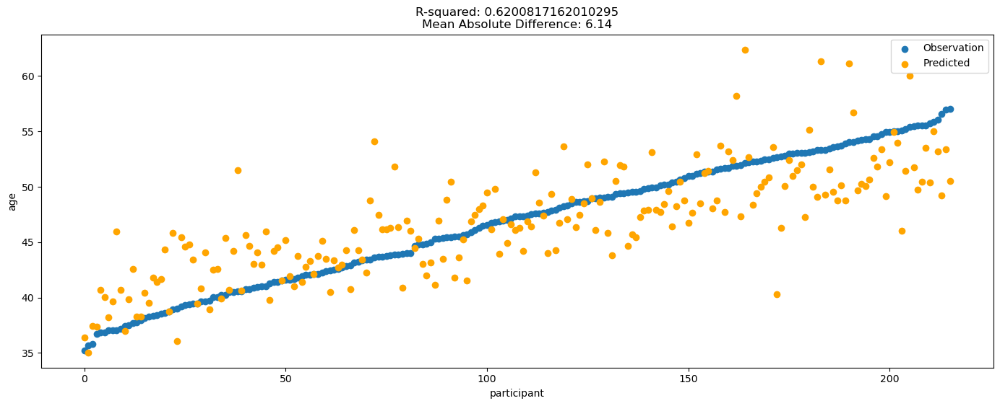

In [4]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.02, 0.025, 0.05, 0.075, 0.1],          
#     'l1_ratio': [0.1, 0.5, 0.7, 0.8, 0.9],         
#     'max_iter': [10000],    
# }

# Best Hyperparameters:
param_grid = {
    'alpha': [0.02],          
    'l1_ratio': [0.9],         
    'max_iter': [10000],    
}

dataloader = {
    'x_train': x_train_R1_scaled,
    'y_train': y_train_R1,
    'x_test': x_test_R1_scaled,
    'y_test': y_test_R1
}

results, best_model_R1, predictions_R1 = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='R1', cores=40)

validation_plot(y_test_R1, predictions_R1)

## Round 2 Model

In [5]:
X = R2_SOMA
y = R2_Age

# Split train/test-data
x_train_R2, x_test_R2, y_train_R2, y_test_R2 = train_test_split(
    X, 
    y, 
    test_size = 0.2, 
    random_state = 1,
)

# Scale with MinMaxScaler
mm_R2 = MinMaxScaler()
x_train_R2_scaled = mm_R2.fit_transform(x_train_R2)
x_test_R2_scaled = mm_R2.transform(x_test_R2)

Best Hyperparameters: {'alpha': 0.02, 'l1_ratio': 0.9, 'max_iter': 10000}
Mean Squared Error (Train): 9.906307952059311
Mean Squared Error (Test): 14.473605785295451
R-squared (Train): 0.7355372939481322
R-squared (Test): 0.6109375075639496


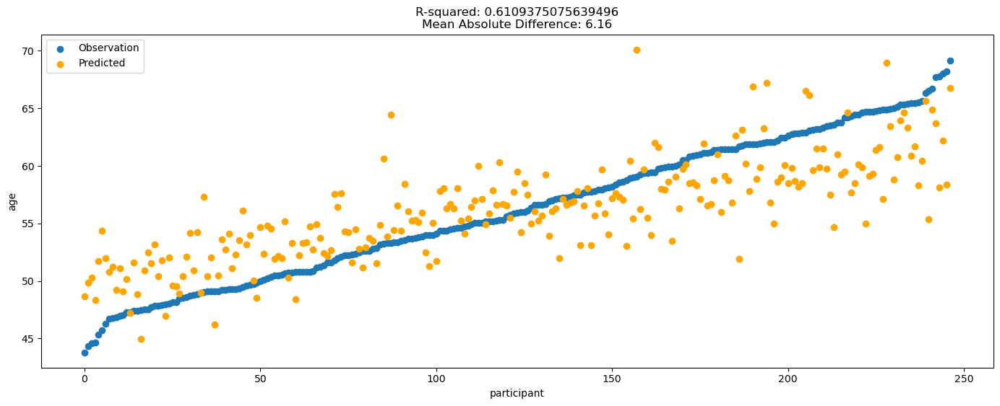

In [6]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.01, 0.02],          
#     'l1_ratio': [0.1, 0.5, 0.9],         
#     'max_iter': [5000],    
# }

param_grid = {
    'alpha': [0.02],          
    'l1_ratio': [0.9],         
    'max_iter': [10000],    
}

dataloader = {
    'x_train': x_train_R2_scaled,
    'y_train': y_train_R2,
    'x_test': x_test_R2_scaled,
    'y_test': y_test_R2
}

results, best_model_R2, predictions_R2 = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='R2', cores=40)

validation_plot(y_test_R2, predictions_R2)

## Model 1 on Round 2 data

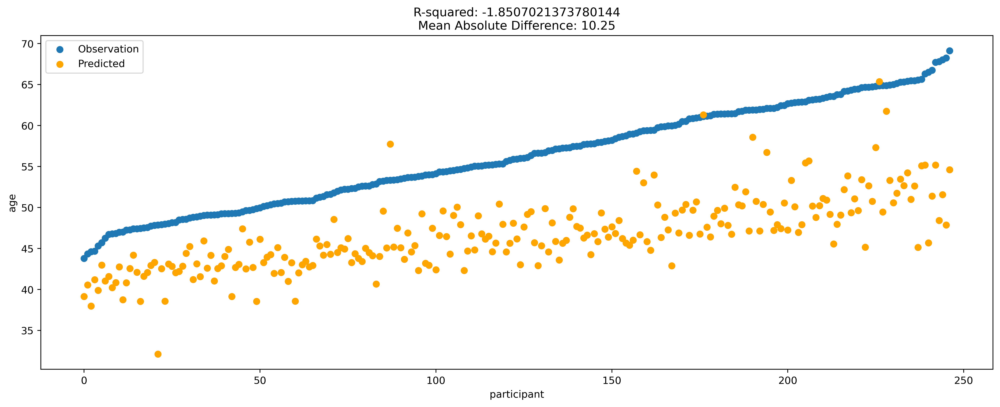

In [39]:
x_test_R2 = x_test_R2.loc[:, mm_R1.feature_names_in_]
x_test_R2_to_R1 = mm_R1.transform(x_test_R2)

y_pred = best_model_R1.predict(x_test_R2_to_R1)
validation_plot(y_test_R2, y_pred)

## Model 2 on Round 1 data

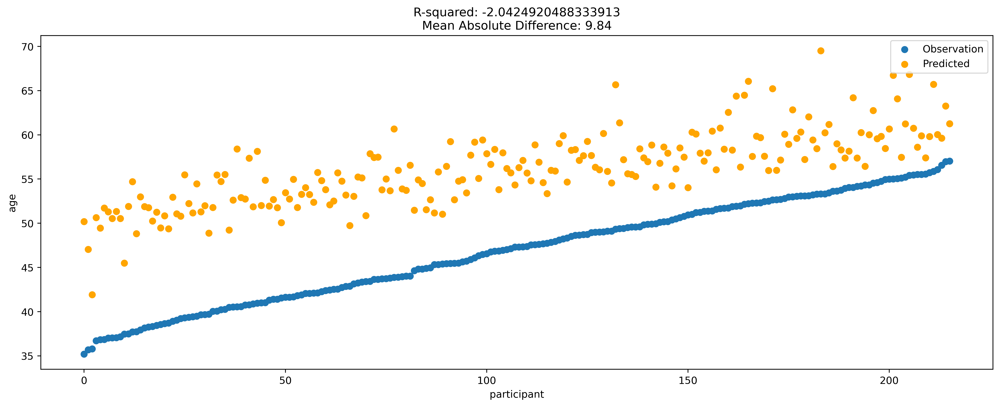

In [40]:
x_test_R1 = x_test_R1.loc[:, mm_R2.feature_names_in_]
x_test_R1_to_R2 = mm_R2.transform(x_test_R1)

y_pred = best_model_R2.predict(x_test_R1_to_R2)
validation_plot(y_test_R1, y_pred)

## Concat Model

Concatenate all data, then split train/test-data.

In [32]:
# Concatenate R1 and R2
All_SOMA = pd.concat([R1_SOMA, R2_SOMA], axis=0)

# Reset index after check
All_SOMA = All_SOMA.reset_index(drop=True)

# Age
All_age = pd.concat([R1_Age, R2_Age], axis=0).reset_index(drop=True)

In [33]:
# Split train/test-data
x_train_R1R2, x_test_R1R2, y_train_R1R2, y_test_R1R2 = train_test_split(
    All_SOMA, 
    All_age, 
    test_size = 0.2, 
    random_state = 1,
)


# Scale data with MinMaxScaler
mm_R1R2 = MinMaxScaler()
x_train_R1R2_scaled = mm_R1R2.fit_transform(x_train_R1R2)
x_test_R1R2_scaled = mm_R1R2.transform(x_test_R1R2)

Best Hyperparameters: {'alpha': 0.015, 'l1_ratio': 0.9, 'max_iter': 10000}
Mean Squared Error (Train): 17.374521386877266
Mean Squared Error (Test): 25.81280065137836
R-squared (Train): 0.7161097409265538
R-squared (Test): 0.6023417396884148


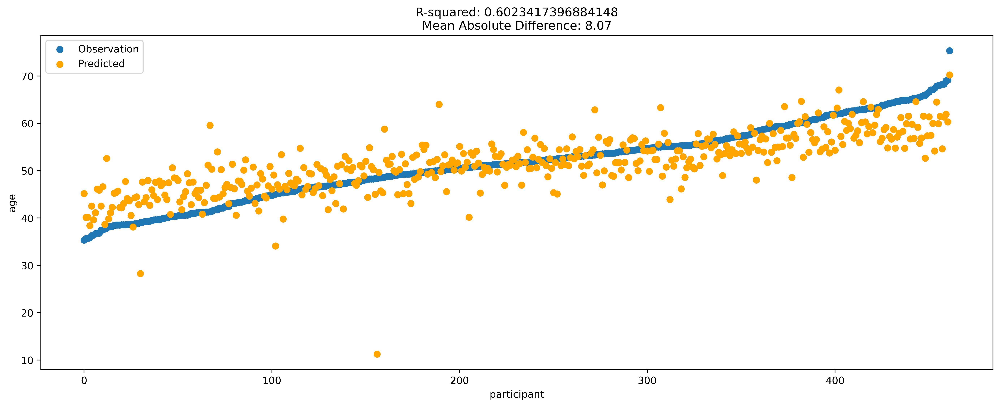

In [34]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.015, 0.02, 0.05],
#     'l1_ratio': [0.1, 0.5, 0.9],
#     'max_iter': [10000],
# }

param_grid = {
    'alpha': [0.015],
    'l1_ratio': [0.9],
    'max_iter': [10000],
}

# Run hyperparameter search
dataloader = {
    'x_train': x_train_R1R2_scaled,
    'y_train': y_train_R1R2,
    'x_test': x_test_R1R2_scaled,
    'y_test': y_test_R1R2
}

results, best_model_R1R2, predictions_R1R2 = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='Concatenated', cores = 40)

validation_plot(y_test_R1R2, predictions_R1R2)

## Mixed Model

Split based on phases so that the same participants are used in both rounds.

In [35]:
# Merge R1 and R2 on indexes
R1R2_SOMAID = R1_SOMA.merge(R2_SOMA, left_index=True, right_index=True)
R1R2_AgeID = R1_Age.merge(R2_Age, left_index=True, right_index=True)

# Combine datasets on indexes
matched_data = R1R2_SOMAID.merge(R1R2_AgeID, left_index=True, right_index=True)

# Remove NA's (eg. participants in R1 but not R2)
matched_data = matched_data.dropna()

In [36]:
# Set seed
np.random.seed(40)

# Dictionary for splitting data
option_dict = {'xy':['_x','_y'], 'yx':['_y','_x']}
round_dict = {'_x': 1, '_y': 2}

# Split train/test-data
train = []
test = []
chosen_rounds = []

for i in matched_data.index:
    chosen_round = option_dict[np.random.choice(['xy', 'yx'])]
    
    train_round_identifier = chosen_round[0]
    test_round_identifier = chosen_round[1]
    
    chosen_rounds.append(round_dict[test_round_identifier])

    train_columns = matched_data.columns.str.endswith(train_round_identifier)
    test_columns = matched_data.columns.str.endswith(test_round_identifier)

    train.append(matched_data.loc[i, train_columns].reset_index(drop=True))
    test.append(matched_data.loc[i, test_columns].reset_index(drop=True))

In [37]:
# Make column names list
shared_proteins = list(set(R1_SOMA.columns) & set(R2_SOMA.columns))
columns = shared_proteins + ['Age']

# Make dataframes
train_df = pd.DataFrame(train)
train_df.columns = columns

test_df = pd.DataFrame(test)
test_df.columns = columns

# Separate x and y
x_mix_train = train_df.drop('Age', axis=1)
y_mix_train = train_df['Age']

x_mix_test = test_df.drop('Age', axis=1)
y_mix_test = test_df['Age']

# Scale data
mixed_model_scaler = MinMaxScaler()
x_mix_train_scaled = mixed_model_scaler.fit_transform(x_mix_train)
x_mix_test_scaled = mixed_model_scaler.transform(x_mix_test)

Best Hyperparameters: {'alpha': 0.0075, 'l1_ratio': 0.5, 'max_iter': 15000}
Mean Squared Error (Train): 5.575549320150291
Mean Squared Error (Test): 23.575603324839225
R-squared (Train): 0.9118475547225355
R-squared (Test): 0.6076506577576914


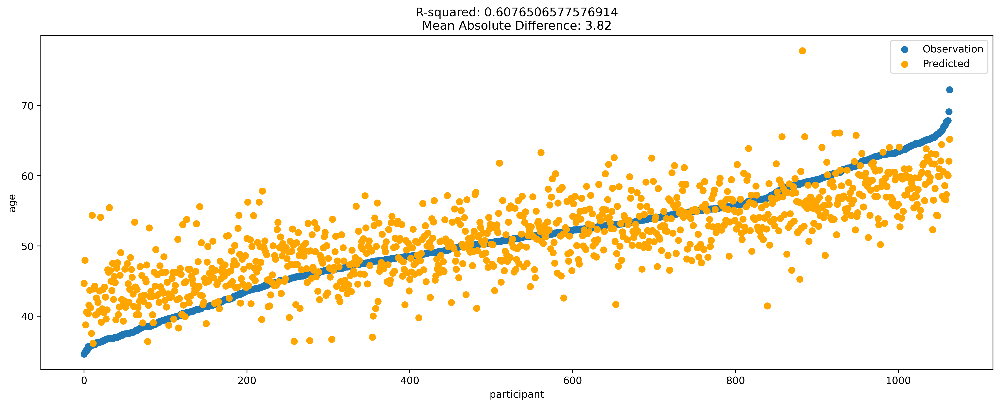

In [38]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.002, 0.005, 0.0075],
#     'l1_ratio': [0.1, 0.5, 0.9],
#     'max_iter': [5000],
# }


param_grid = {
    'alpha': [0.0075],
    'l1_ratio': [0.5],
    'max_iter': [15000],
}

# Run hyperparameter search
dataloader = {
    'x_train': x_mix_train_scaled,
    'y_train': y_mix_train,
    'x_test': x_mix_test_scaled,
    'y_test': y_mix_test
}

results, best_model, predictions_mixed = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='mixed')

validation_plot(y_mix_test, predictions_mixed)

## Smarter concat

Keep rounds together when making the train/test split.

In [32]:
# Find shared subset
shared_samples = list(set(R1_SOMAMeta.index) & set(R2_SOMAMeta.index))

# Sample without replacement
np.random.seed(40)
train_size = int(0.8*len(shared_samples)//1)

print(f'Samples in training set: {train_size}')
sample_index = np.random.choice(shared_samples, size=train_size, replace=False)

# Train data
X_train_R1 = R1_SOMA.loc[sample_index]
X_train_R2 = R2_SOMA.loc[sample_index]
y_train_R1 = R1_Age.loc[sample_index]
y_train_R2 = R2_Age.loc[sample_index]

# Test data
X_test_R1 = R1_SOMA.drop(sample_index)
X_test_R2 = R2_SOMA.drop(sample_index)
y_test_R1 = R1_Age.drop(sample_index)
y_test_R2 = R2_Age.drop(sample_index)

Samples in training set: 851


In [33]:
# Concat R1 and R2
X_train = pd.concat([X_train_R1, X_train_R2], axis=0)
X_test = pd.concat([X_test_R1, X_test_R2], axis=0)

y_train = pd.concat([y_train_R1, y_train_R2], axis=0)['Age']
y_test = pd.concat([y_test_R1, y_test_R2], axis=0)['Age']

smarter_scale = MinMaxScaler()
X_train = smarter_scale.fit_transform(X_train)
X_test = smarter_scale.transform(X_test)

Best Hyperparameters: {'alpha': 0.012, 'l1_ratio': 0.9, 'max_iter': 15000}
Mean Squared Error (Train): 13.591543515340522
Mean Squared Error (Test): 32.446709829237705
R-squared (Train): 0.7759467831798517
R-squared (Test): 0.5005137138563176


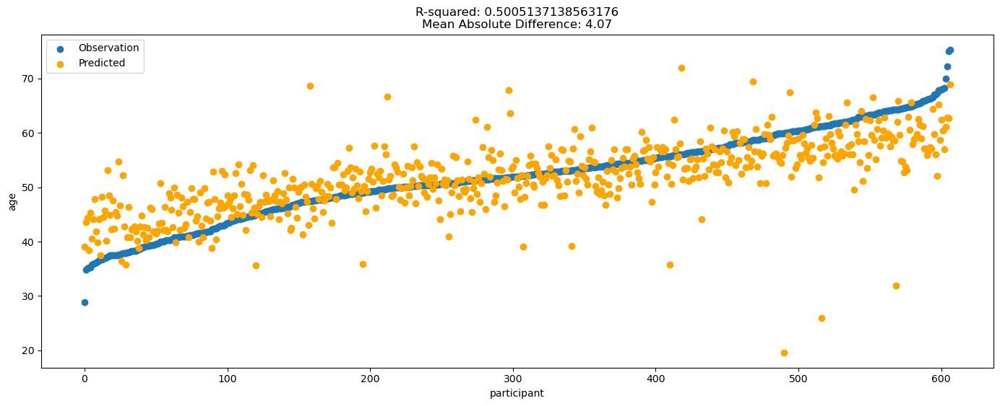

In [34]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.002, 0.005, 0.0075],
#     'l1_ratio': [0.1, 0.5, 0.9],
#     'max_iter': [5000],
# }


param_grid = {
    'alpha': [0.012], 
    'l1_ratio': [0.9], 
    'max_iter': [15000]
}

# Run hyperparameter search
dataloader = {
    'x_train': X_train,
    'y_train': y_train,
    'x_test': X_test,
    'y_test': y_test
}

results, best_model, predictions_smartcc = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='smart')

validation_plot(y_test, predictions_smartcc)

## Average Model

Take the average between Round 1 and Round 2

In [ ]:
# Cross
cross = [x for x in R1_SOMA.index if x in R2_SOMA.index]

# Age
age_avg = (R1_Age.loc[cross] + R2_Age.loc[cross]) / 2

# SOMA
SOMA_avg = (R1_SOMA.loc[cross] + R2_SOMA.loc[cross]) / 2

In [ ]:
# Split train/test-data
X = SOMA_avg
y = age_avg

x_train_avg, x_test_avg, y_train_avg, y_test_avg = train_test_split(
    X, 
    y, 
    test_size = 0.2, 
    random_state = 42,
)


sc = MinMaxScaler()
x_train_avg = sc.fit_transform(x_train_avg)
x_test_avg = sc.transform(x_test_avg)

Best Hyperparameters: {'alpha': 0.015, 'l1_ratio': 0.7, 'max_iter': 15000}
Mean Squared Error (Train): 5.6881870150079425
Mean Squared Error (Test): 11.424502399964418
R-squared (Train): 0.8443946286113231
R-squared (Test): 0.6755853945753216


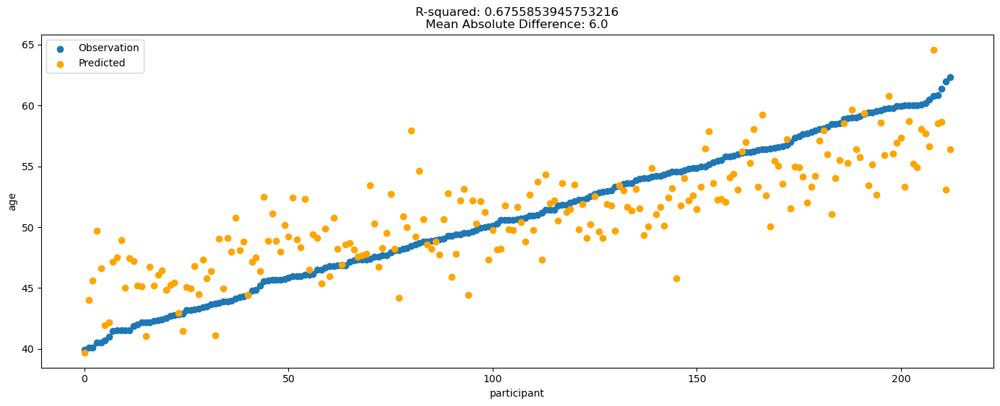

In [ ]:
# param_grid = {
#     'alpha':[0.01, 0.05, 0.1], 
#     'l1_ratio':[0.1, 0.5, 0.9], 
#     'max_iter': [5000]}


param_grid = {
    'alpha': [0.015], 
    'l1_ratio': [0.7], 
    'max_iter': [15000]
}


# Run hyperparameter search
dataloader = {
    'x_train': x_train_avg,
    'y_train': y_train_avg,
    'x_test': x_test_avg,
    'y_test': y_test_avg
}

results, best_model_avg, predictions_avg = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='avg')

validation_plot(y_test_avg, predictions_avg)

# Biological clocks

## Delta Model

In [29]:
# Cross
cross = [x for x in R1_SOMA.index if x in R2_SOMA.index]

# Age
age_delta = R2_Age.loc[cross] - R1_Age.loc[cross]

# SOMA
SOMA_delta = R2_SOMA.loc[cross] - R1_SOMA.loc[cross]

In [30]:
# Split train/test-data
X = SOMA_delta
y = age_delta

x_train_delta, x_test_delta, y_train_delta, y_test_delta = train_test_split(
    X, 
    y, 
    test_size = 0.2, 
    random_state = 42,
)


sc = MinMaxScaler()
x_train_delta = sc.fit_transform(x_train_delta)
x_test_delta = sc.transform(x_test_delta)

Best Hyperparameters: {'alpha': 0.005, 'l1_ratio': 0.4, 'max_iter': 15000}
Mean Squared Error (Train): 0.6807116197186294
Mean Squared Error (Test): 1.4224049727223957
R-squared (Train): 0.6661519958805772
R-squared (Test): 0.34548928000071677


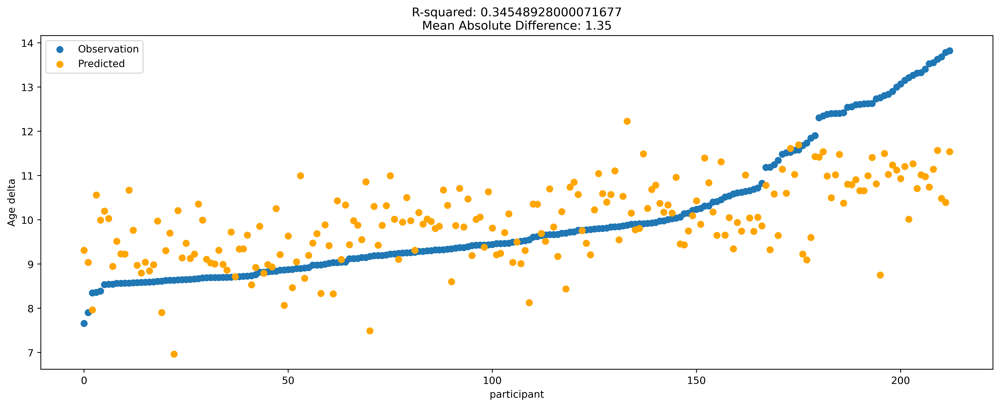

In [31]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.002, 0.005, 0.0075],
#     'l1_ratio': [0.1, 0.5, 0.9],
#     'max_iter': [5000],
# }

param_grid = {
    'alpha': [0.005], 
    'l1_ratio': [0.4], 
    'max_iter': [15000]
}


# Run hyperparameter search
dataloader = {
    'x_train': x_train_delta,
    'y_train': y_train_delta,
    'x_test': x_test_delta,
    'y_test': y_test_delta
}

results, best_model, predictions_delta = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='delta')

validation_plot(y_test_delta, predictions_delta, y_axis_label='Age delta')

## R1 + Delta Model

Design: R1 + Delta

In [38]:
# Find shared subset
shared_samples = list(set(R1_SOMAMeta.index) & set(R2_SOMAMeta.index))
shared_proteins = list(set(R1_SOMA.columns) & set(R2_SOMA.columns))

# Sample without replacement
np.random.seed(42)
train_size = int(0.8*len(shared_samples)//1)

print(f'Samples in training set: {train_size}')
sample_index = np.random.choice(shared_samples, size=train_size, replace=False)
print(f'Samples in test set: {len(shared_samples) - train_size}')

# Train data
X_train_R1 = R1_SOMA.loc[sample_index]
X_train_R2 = R2_SOMA.loc[sample_index]
y_train_R1 = R1_Age.loc[sample_index]
y_train_R2 = R2_Age.loc[sample_index]

# Test data
X_test_R1 = R1_SOMA.drop(sample_index)
X_test_R2 = R2_SOMA.drop(sample_index)
y_test_R1 = R1_Age.drop(sample_index)
y_test_R2 = R2_Age.drop(sample_index)

# Calculate deltas
soma_delta_train = X_train_R2 - X_train_R1
soma_delta_test = X_test_R2 - X_test_R1

age_delta_train = y_train_R2 - y_train_R1
age_delta_test = y_test_R2 - y_test_R1

# Rename columns so it's clear whether they are deltas or R1
soma_delta_train.columns = [f'{col}_delta' for col in soma_delta_train.columns]
soma_delta_test.columns = [f'{col}_delta' for col in soma_delta_test.columns]

X_train_R1.columns = [f'{col}_R1' for col in X_train_R1.columns]
X_test_R1.columns = [f'{col}_R1' for col in X_test_R1.columns]

# Concat R1 and deltas
X_train_R1_delta = pd.concat([X_train_R1, soma_delta_train], axis=1)
X_test_R1_delta = pd.concat([X_test_R1, soma_delta_test], axis=1)

# Remove NaN values
X_train_R1_delta.dropna(inplace=True)
X_test_R1_delta.dropna(inplace=True)
age_delta_train.dropna(inplace=True)
age_delta_test.dropna(inplace=True)

# MinMax scale
scaler_R1_delta = MinMaxScaler()
X_train = scaler_R1_delta.fit_transform(X_train_R1_delta)
X_test = scaler_R1_delta.transform(X_test_R1_delta)

Samples in training set: 851
Samples in test set: 213


Best Hyperparameters: {'alpha': 0.01, 'l1_ratio': 0.9, 'max_iter': 5000}
Mean Squared Error (Train): 1.2181513577463907
Mean Squared Error (Test): 1.6609178253055796
R-squared (Train): 0.39150689858427634
R-squared (Test): 0.2830859632445295


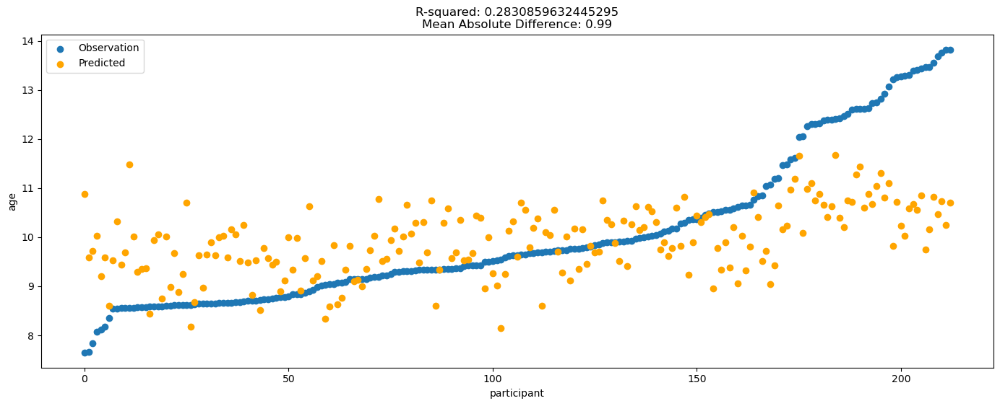

In [39]:
# Define the parameter grid for hyperparameter tuning
# param_grid = {
#     'alpha': [0.002, 0.005, 0.0075],
#     'l1_ratio': [0.1, 0.5, 0.9],
#     'max_iter': [5000],
# }

param_grid = {
    'alpha': [0.01],
    'l1_ratio': [0.9],
    'max_iter': [5000],
}

# Run hyperparameter search
dataloader = {
    'x_train': X_train,
    'y_train': age_delta_train['Age'],
    'x_test': X_test,
    'y_test': age_delta_test['Age']
}

results, best_model, predictions_R1_delta = hyperparameter_search_EN(dataloader, param_grid, results, clock_name='R1_delta')

validation_plot(age_delta_test['Age'], predictions_R1_delta)

## Biological clock - Idea 3 (archived)

Similar to how a person's biological age is defined as the age when they develop cancer, we define age of an IMT greater than 0.9 as the age of the event.

In [8]:
IMT = R2_Meta[['visit_id','Age R1 (year)','Age R2 (year)', 'Carotid IMT R1', 'Carotid IMT R2']]


# Filter people that have reached the threshold already
IMT = IMT.loc[IMT['Carotid IMT R2'] < 0.9, :]
IMT = IMT.loc[IMT['Carotid IMT R1'] < 0.9, :]

# Select only "aging" participants
IMT = IMT.loc[IMT['Carotid IMT R1'] < IMT['Carotid IMT R2'], :] 

# Calculate rate of change
IMT['dydx'] = (IMT['Carotid IMT R2'] - IMT['Carotid IMT R1']) / (IMT['Age R2 (year)'] - IMT['Age R1 (year)'])

# Calculate age of event by extrapolation
IMT['age_event'] = (0.9 - IMT['Carotid IMT R2']) / IMT['dydx'] + IMT['Age R2 (year)']

# Select only people with concerningly fast carotid thickening
q3 = IMT['dydx'].quantile(0.8)
IMT = IMT.loc[IMT['dydx'] > q3, :]

# Select participants that have SOMA data in both R1 and R2
cross_ids = list(set(R1_SOMA.index) & set(R2_SOMA.index) & set(IMT.index))


IMT = IMT.loc[cross_ids]
IMT_delta = R2_SOMA.loc[cross_ids] - R1_SOMA.loc[cross_ids]
IMT_average = (R2_SOMA.loc[cross_ids] + R1_SOMA.loc[cross_ids])/2


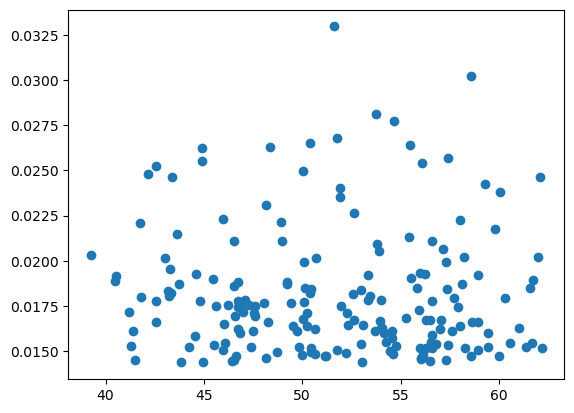

In [7]:
# Rate of Carotid IMT thickening does not seem to be affected by age, which is counterintuitive
plt.scatter((IMT['Age R2 (year)'] + IMT['Age R1 (year)'])/2, IMT['dydx'])
plt.show()

In [22]:
# Correlation of delta with rate of thickening:
rates = IMT['dydx']

delta_rates = correlation_list(IMT_delta, rates, analyte_conv)
delta_rates[0:10]

,Pearson Correlation,SeqIndex,EntrezGeneSymbol
0,-0.347579,seq.20593.10,B3GALT5
1,-0.327949,seq.20955.20,ADAT2
2,0.325449,seq.12483.62,RORB
3,0.320353,seq.22378.2,KRT34
4,0.311503,seq.23679.43,DSCC1
5,0.308481,seq.11825.27,PPARGC1A
6,0.267815,seq.11155.16,COL6A5
7,-0.266133,seq.6404.20,C1QL1
8,-0.260612,seq.21339.19,GPT2
9,0.254447,seq.18158.45,CASP8


In [13]:
# Correlation of delta with expected age of IMT = 0.9mm:
age_event = IMT['age_event']

correlation_list(IMT_delta, age_event, analyte_conv)[0:10]

,Pearson Correlation,SeqIndex,EntrezGeneSymbol
0,0.286807,seq.23252.4,DNAJB3
1,-0.281335,seq.21926.24,UBE2D1|UBB
2,0.280968,seq.23520.60,MBLAC2
3,0.266706,seq.6411.58,DEFB135
4,0.264672,seq.8990.42,ATP1B3
5,-0.262796,seq.21757.49,USP22
6,0.257206,seq.21339.19,GPT2
7,0.257165,seq.7089.42,SYT11
8,-0.255289,seq.6151.18,MAP2K3
9,-0.255274,seq.24910.18,NONO


In [23]:
# Correlation of average with rate of thickening:

average_rates = correlation_list(IMT_average, rates, analyte_conv)

average_rates[0:10]

,Pearson Correlation,SeqIndex,EntrezGeneSymbol
0,0.334827,seq.12483.62,RORB
1,0.330706,seq.7077.9,NaN
2,0.329896,seq.22378.2,KRT34
3,0.328231,seq.13025.4,FRS2
4,0.321950,seq.20955.20,ADAT2
5,0.293328,seq.11547.84,MUSK
6,0.287416,seq.18417.3,AS3MT
7,0.286121,seq.20593.10,B3GALT5
8,0.284847,seq.11311.79,RAG1
9,0.282637,seq.23578.6,SMIM3


In [15]:
# Correlation of average with expected age of IMT = 0.9mm:

correlation_list(IMT_average, age_event, analyte_conv)[0:10]

,Pearson Correlation,SeqIndex,EntrezGeneSymbol
0,0.353696,seq.4914.10,CGA|CGB3|CGB7
1,0.313589,seq.21721.6,CHST10
2,0.291383,seq.3032.11,CGA|FSHB
3,0.277452,seq.12389.4,ORC6
4,0.269960,seq.15542.19,CKMT1A
5,0.267650,seq.13494.6,CERS5
6,0.264229,seq.2953.31,CGA|LHB
7,-0.262894,seq.23212.8,EURL
8,0.260776,seq.6546.41,DKK2
9,-0.258242,seq.20135.85,RNGTT


In [47]:
# Select 100 best correlated
average_rates_sel = average_rates[0:100]
delta_rates_sel = delta_rates[0:100]

# Find intersect on EntrezGeneSymbol, where average and delta correlation are the same
intersect = list(set(average_rates_sel['EntrezGeneSymbol']).intersection(set(delta_rates_sel['EntrezGeneSymbol'])))
intersect = [x for x in intersect if str(x) != 'nan']
intersect = [gene for gene in intersect if np.sign(average_rates_sel[average_rates_sel['EntrezGeneSymbol'] == gene]['Pearson Correlation']).iloc[0] == np.sign(delta_rates_sel[delta_rates_sel['EntrezGeneSymbol'] == gene]['Pearson Correlation']).iloc[0]]

# Interpretation: These are genes which have the same correlation in both delta and average
# meaning:  if a low average protein intensity is correlated with an increase in IMT thickness
#           and that same protein is also correlated with an increase in IMT when it decreases further,
#           then it is selected in the intersect 
intersect


['INIP',
 'PSMD5',
 'KLC3',
 'RAG1',
 'KRT34',
 'COL6A5',
 'NR5A2',
 'CCDC115',
 'PPARGC1A',
 'FNDC4',
 'RORB',
 'LIMK1']

In [48]:
average_rates_sel[average_rates_sel['EntrezGeneSymbol'].isin(intersect)]

,Pearson Correlation,SeqIndex,EntrezGeneSymbol
0,0.334827,seq.12483.62,RORB
2,0.329896,seq.22378.2,KRT34
8,0.284847,seq.11311.79,RAG1
11,0.270254,seq.25308.8,LIMK1
37,0.216260,seq.13451.2,FNDC4
47,0.210028,seq.10716.35,PSMD5
50,0.208070,seq.24658.98,CCDC115
51,0.207662,seq.12444.39,NR5A2
52,0.207332,seq.11825.27,PPARGC1A
63,0.201720,seq.11155.16,COL6A5


# Correlation analysis

In [4]:
%run correlation_functions.py

## Average Model

Calculate age gaps using a smoothed curve

MAE: 2.754634823069417


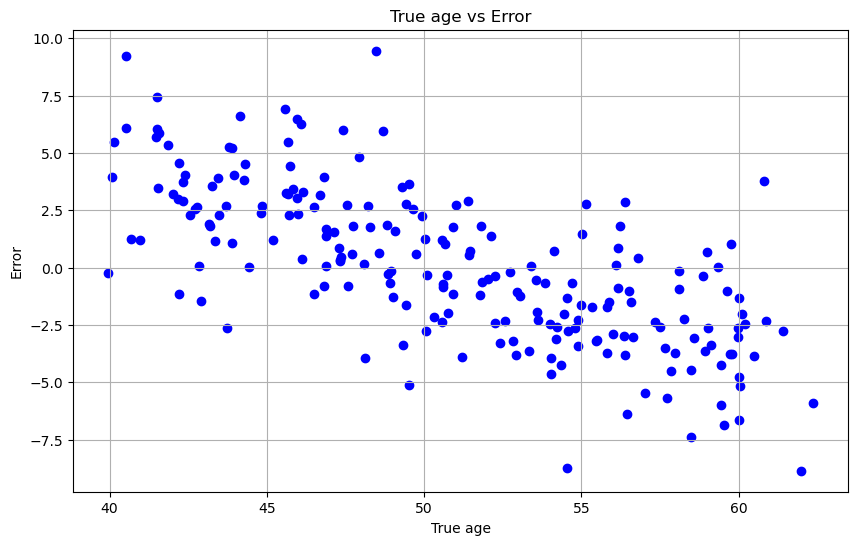

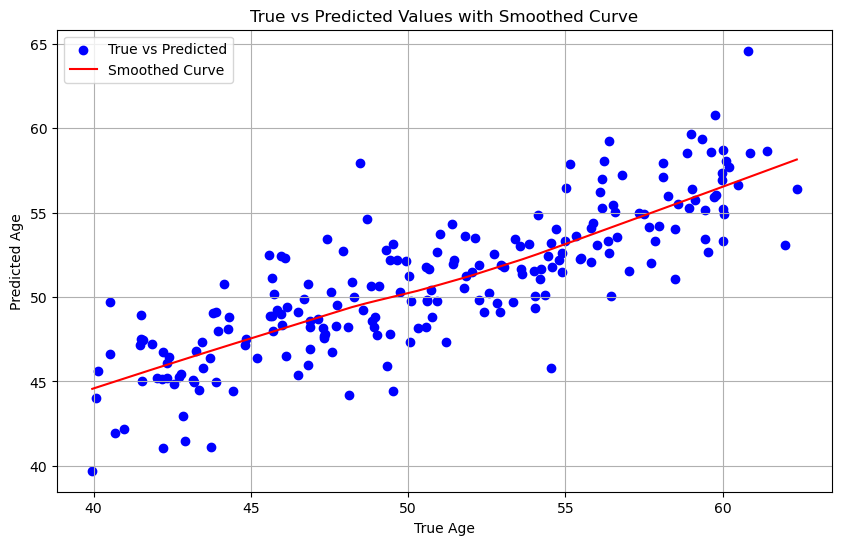

,Age,Predicted Age,Error,Individual age gaps
visit_id,,,,
2101404,60.096370,58.081684,-2.014686,1.474877
4050801,46.871301,48.234853,1.363552,-0.407286
3022403,56.626644,53.587745,-3.038899,-0.661373


In [49]:
corr_data_average = fit_smoother(process_outputs(y_test_avg, predictions_avg), show_plot=True)

corr_data_average.head(3)

Create metadata table to do the correlation analysis with

In [50]:
metadata_average = get_metadata_average(R1_Meta, R2_Meta, rows=y_test_avg.index)

print(metadata_average.shape)
metadata_average.head(3)

(213, 19)


,Carotid IMT average,Femoral IMT average,BMI averaged (kg/m2),Systolic BP average (mmHg),Diastolic BP average (mmHg),Pulse Pressure average (mmHg),Total cholesterol average,HDL cholesterol average,LDL cholesterol average,Triglycerides average (mg/dl),High sensitive CRP average (mg/dL),IL6 average,White blood cells average,Fibrinogen average,Homocystein average,Glycemia average,Creatinin average (mg/dl),Uric acid average (mg/dL),Pack years nicotine average (year)
visit_id,,,,,,,,,,,,,,,,,,,
2101404,0.664530,0.594363,22.189731,143.000000,84.583333,58.416667,187.0,80.5,90.0,82.0,0.660,0.000,7.350,333.5,12.70,0.940,0.745,3.55,0.0
4050801,0.736973,0.528117,23.208884,123.916667,82.000000,41.916667,224.5,92.0,117.0,75.6,2.425,1.235,6.070,376.0,11.54,0.885,0.950,4.79,0.0
3022403,0.572667,0.650863,21.687054,132.916667,84.916667,48.000000,221.5,88.0,115.5,88.4,1.075,0.000,4.695,386.0,7.99,1.055,0.585,4.51,0.0


Perform correlation analysis

In [51]:
correlation_analysis(corr_data_average, metadata_average)

,Predictor,Pearson Correlation,P-value,Corrected P-value,Reject Null Hypothesis
0,BMI averaged (kg/m2),0.282930,0.000028,0.000528,True
1,Glycemia average,0.204280,0.002740,0.021646,True
2,Uric acid average (mg/dL),0.199734,0.003418,0.021646,True
3,Diastolic BP average (mmHg),0.186181,0.006428,0.027550,True
4,High sensitive CRP average (mg/dL),0.183928,0.007250,0.027550,True
5,Triglycerides average (mg/dl),0.172848,0.011509,0.036447,True
6,Systolic BP average (mmHg),0.169117,0.013455,0.036521,True
7,Total cholesterol average,0.156356,0.022455,0.048603,True
8,Fibrinogen average,0.155713,0.023022,0.048603,True
9,LDL cholesterol average,0.135644,0.051894,0.098599,False


## Biological clock

Calculate age gaps using a smoothed curve

MAE: 0.9389566347278511


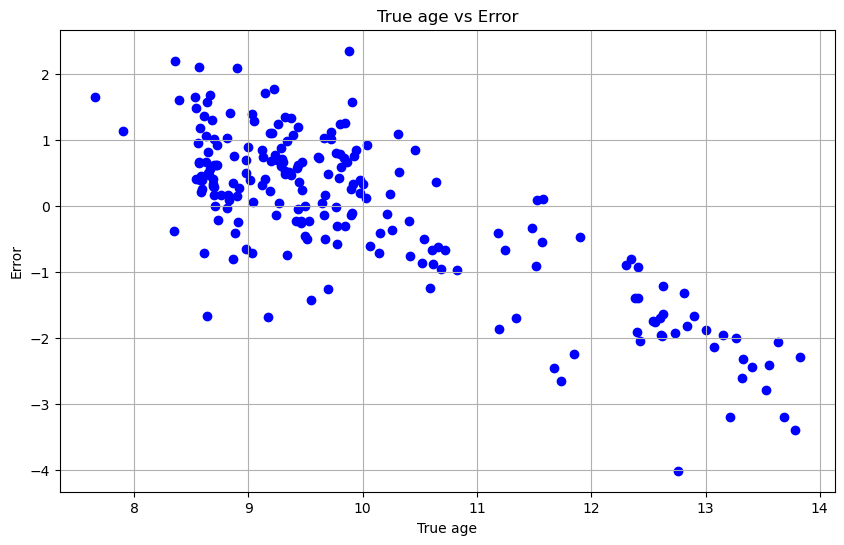

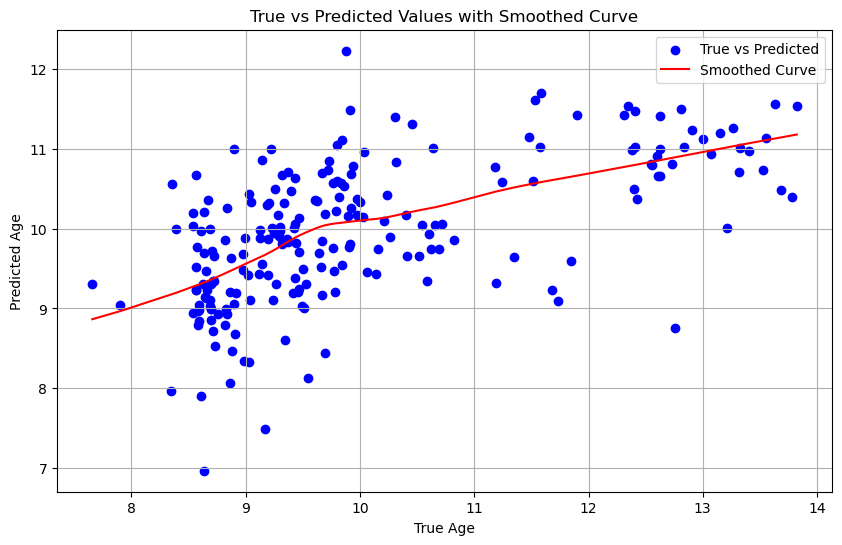

,Age,Predicted Age,Error,Individual age gaps
visit_id,,,,
2101404,10.212740,10.095076,-0.117664,-0.041339
4050801,9.802603,10.593222,0.790619,0.524324
3022403,8.593288,8.846989,0.253701,-0.454441


In [52]:
corr_data_delta = fit_smoother(process_outputs(y_test_delta, predictions_delta), show_plot=True)

corr_data_delta.head(3)

Create metadata table to do the correlation analysis with

In [53]:
metadata_delta = get_metadata_delta(R1_Meta, R2_Meta, rows=y_test_delta.index)

print(metadata_delta.shape)
metadata_delta.head(3)

(213, 19)


,Carotid IMT delta,Femoral IMT delta,BMI delta (kg/m²),Systolic BP delta (mmHg),Diastolic BP delta (mmHg),Pulse Pressure delta (mmHg),Total cholesterol delta,HDL cholesterol delta,LDL cholesterol delta,Triglycerides delta (mg/dl),High sensitive CRP delta (mg/dL),IL6 delta,White blood cells delta,Fibrinogen delta,Homocystein delta,Glycemia delta,Creatinin delta (mg/dl),Uric acid delta (mg/dL),Pack years nicotine delta (year)
visit_id,,,,,,,,,,,,,,,,,,,
2101404,0.073060,0.219726,1.979463,-4.000000,-2.833333,-1.166667,-72,-17,-54.0,-2.0,-0.04,0.00,1.40,-19.0,-2.60,0.00,0.03,-1.10,0.0
4050801,0.019946,0.085234,1.617768,33.833333,22.000000,11.833333,39,2,30.0,36.8,2.49,-0.41,1.22,52.0,-1.68,-0.01,-0.20,-0.58,0.0
3022403,0.033333,-0.046274,2.174109,-12.166667,-6.166667,-6.000000,-105,-6,-95.0,-12.8,-0.09,0.00,1.15,2.0,-2.10,0.29,-0.03,-0.82,0.0


Perform correlation analysis

In [54]:
correlation_analysis(corr_data_delta, metadata_delta)

,Predictor,Pearson Correlation,P-value,Corrected P-value,Reject Null Hypothesis
0,High sensitive CRP delta (mg/dL),-0.104194,0.130475,0.628008,False
1,Carotid IMT delta,0.101960,0.138028,0.628008,False
2,White blood cells delta,-0.101899,0.138268,0.628008,False
3,LDL cholesterol delta,0.101127,0.148085,0.628008,False
4,Femoral IMT delta,0.095420,0.165265,0.628008,False
5,HDL cholesterol delta,-0.078665,0.253002,0.801174,False
6,Uric acid delta (mg/dL),0.068982,0.316329,0.858608,False
7,IL6 delta,-0.010895,0.877694,0.960859,False
8,Triglycerides delta (mg/dl),-0.011305,0.869709,0.960859,False
9,Fibrinogen delta,0.013812,0.841170,0.960859,False


Delta correlations with average metadata gives one significant correlation.

In [56]:
metadata_average_for_delta = get_metadata_average(R1_Meta, R2_Meta, rows=y_test_delta.index)
correlation_analysis(corr_data_delta, metadata_average_for_delta)

,Predictor,Pearson Correlation,P-value,Corrected P-value,Reject Null Hypothesis
0,High sensitive CRP average (mg/dL),0.224779,0.000982,0.018649,True
1,Creatinin average (mg/dl),-0.134200,0.050476,0.399489,False
2,Fibrinogen average,0.114292,0.096178,0.399489,False
3,LDL cholesterol average,-0.107826,0.122910,0.399489,False
4,Pulse Pressure average (mmHg),0.106727,0.120447,0.399489,False
5,Homocystein average,-0.101551,0.139624,0.399489,False
6,Femoral IMT average,-0.099230,0.166435,0.399489,False
7,Total cholesterol average,-0.094763,0.168206,0.399489,False
8,Carotid IMT average,-0.055913,0.416875,0.720057,False
9,Diastolic BP average (mmHg),-0.056185,0.414605,0.720057,False


## Mixed Model

Calculate age gaps using a smoothed curve

MAE: 3.8241983533291695


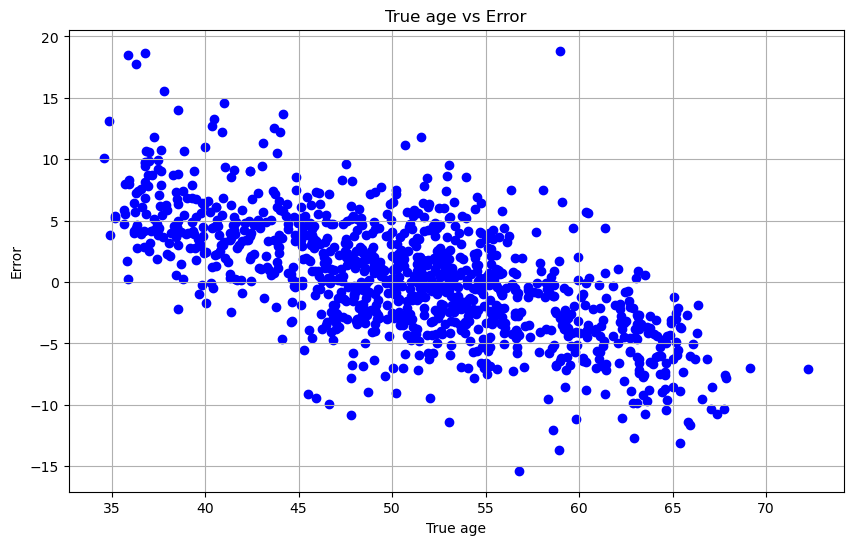

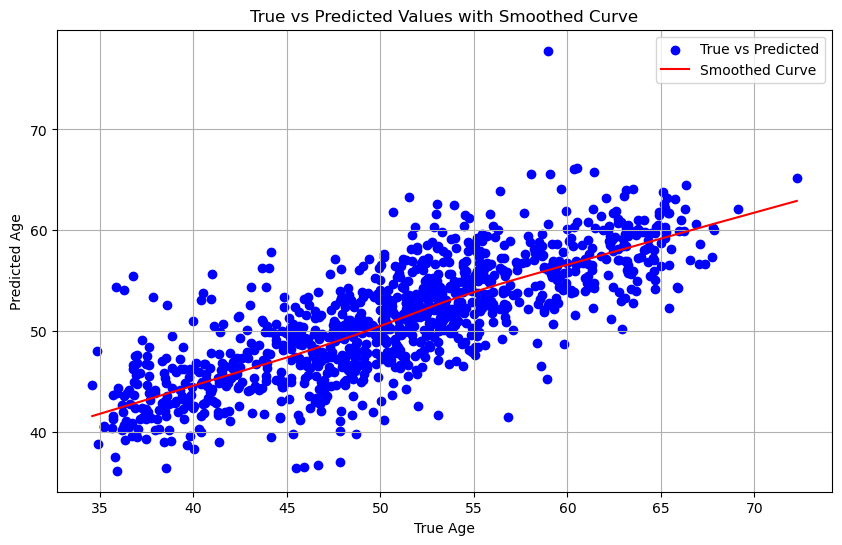

In [57]:
corr_data_mixed = fit_smoother(process_outputs(y_mix_test, predictions_mixed), show_plot=True)

Create metadata table to do the correlation analysis with

In [58]:
mixed_metadata = get_mixed_metadata(R1_Meta, R2_Meta, matched_data, chosen_rounds)

mixed_metadata.head(3)

,Carotid IMT,Femoral IMT,BMI (kg/m²),Systolic BP (mmHg),Diastolic BP (mmHg),Pulse Pressure (mmHg),Total cholesterol,HDL cholesterol,LDL cholesterol,Triglycerides (mg/dl),High sensitive CRP (mg/dL),IL6,White blood cells,Fibrinogen,Homocystein,Glycemia,Creatinin (mg/dl),Uric acid (mg/dL),Pack years nicotine (year),Smoker
2100302,0.787605,0.631157,25.142857,126.666667,76.166667,50.5,285,78,184.0,117,1.79,0.0,6.88,236,13.9,0.92,0.94,4.7,23.1,no
2100701,0.738,0.578,28.4,132,82,50,188,69,95.0,117.0,1.35,4.7,6.57,359.0,9.04,0.97,0.82,5.63,9.7,no
2100702,0.631,0.3865,20.9,130,88,42,225,101,113.0,59.0,1.03,0.0,3.82,415.0,9.36,0.83,0.87,4.33,13.3,no


Perform correlation analysis

In [59]:
correlation_analysis(corr_data_mixed, mixed_metadata)

,Predictor,Pearson Correlation,P-value,Corrected P-value,Reject Null Hypothesis
0,Total cholesterol,0.094338,0.002067,0.034957,True
1,HDL cholesterol,0.086936,0.004542,0.034957,True
2,Fibrinogen,0.085020,0.005520,0.034957,True
3,LDL cholesterol,0.078609,0.010755,0.042522,True
4,Homocystein,0.076675,0.012356,0.042522,True
5,Uric acid (mg/dL),0.074125,0.015591,0.042522,True
6,Diastolic BP (mmHg),0.074106,0.015666,0.042522,True
7,BMI (kg/m²),0.064928,0.034205,0.081237,False
8,Systolic BP (mmHg),0.060164,0.049876,0.105294,False
9,Triglycerides (mg/dl),-0.047590,0.120808,0.229535,False


# Gene Set Enrichment Analysis (GSEA)

## Average model

In [60]:
# Get coefficients from the model
coefficients = best_model_avg.coef_
df = pd.DataFrame({'SeqIndex': shared_proteins, 'Coefficient': coefficients})

print(f"upregulated genes: {len(df[df.Coefficient > 0])}") 
print(f"downregulated genes: {len(df[df.Coefficient < 0])}") 
print(f"stable genes: {len(df[df.Coefficient == 0])}") 

upregulated genes: 240
downregulated genes: 231
stable genes: 7052


In [61]:
# Add EntrezGeneSymbols to the dataframe
merged_df = pd.merge(analyte_conv, df, on='SeqIndex', how='inner')

# Display highest up/downregulated genes
merged_df = merged_df.iloc[np.abs(merged_df['Coefficient']).argsort()[::-1]]

merged_df.head(10)

,SeqIndex,EntrezGeneSymbol,Coefficient
6908,seq.8841.65,CILP2,-5.074634
4844,seq.3032.11,CGA|FSHB,4.022474
2035,seq.16890.37,ADAMTSL1,3.997101
6623,seq.8080.24,MSMP,-3.448097
3687,seq.22587.37,EPHA6,3.433488
2140,seq.17447.52,SFRP4,-2.651444
6353,seq.7251.64,C1QTNF3,2.444984
5712,seq.5631.83,MLN,2.377742
2492,seq.18880.81,COL3A1,-2.119117
4327,seq.2475.1,KIT,-2.113975


The rest of the analysis is done in R.